# Testing TPS and Alternatives

Notebook for testing different TPS implementations, testing potential alternatives for TPS, and testing robustness of TPS to noise etc.

In [ ]:
import os
import kornia as K
import numpy as np
import torch
import matplotlib.pyplot as plt
import math 
import skimage as ski

from leafalignment.utils import convert_image_to_tensor, match_sizes_resize, group_by_argmax
from leafalignment.utils import affine_warp_expand, affine_warp_image, affine_warp_points
from leafalignment.DatasetTools.LeafImageSeries import LeafDataset
from leafalignment.masking import fetch_image_mask_pair
from leafalignment.loftr import loftr_match, warp_tps_skimage, tps_skimage, tps_skimage_confidence, filter_matches_by_grid, filter_matches_by_cluster, filter_matches_by_min_distance, filter_matches_by_confidence, fit_tps_torch, warp_tps_torch, warp_tps_points_torch, torch_tps
from leafalignment.registration import fetch_registered_image_mask_seq
from leafalignment.plotting import plot_image_series, plot_image_pair, plot_overlay, plot_match_coverage, plot_img_transform

In [ ]:
leaf = LeafDataset(
    base_dir='../../leaf-image-sequences',
    # leaf_uid="ESWW0070020_2",
    leaf_uid="ESWW0070040_6", # has much missing data 
    load=('roi_leaf_masks'),
    # load=('target_images', 'target_masks', 'leaf_masks', 'seg_masks', 'det_masks', 'cropped_images', 'rois', 'images', 'keypoints', 'roi_leaf_masks'),
    verbose=False
)

Processing series: 100%|██████████| 17/17 [00:05<00:00,  3.17it/s]


Total matches: 1079
Matches with Confidence > 0.5: 387
Inliers: 206 (19.09%)


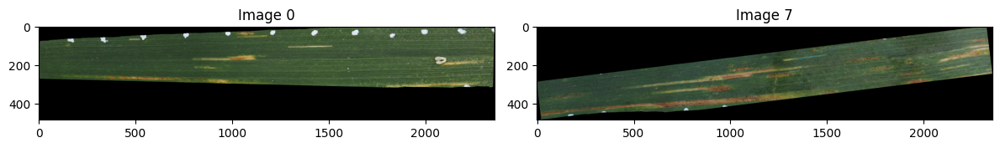

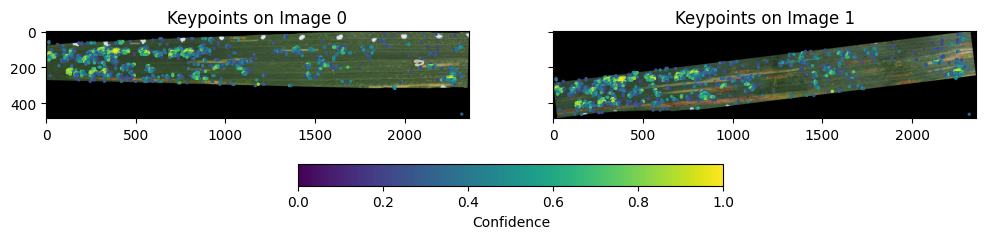

In [4]:
fix_ind = 0
# mov_ind = 2 # easy example
mov_ind = 7 # hard example
img_fixed, mask_fixed = fetch_image_mask_pair(leaf, fix_ind, img_scale="roi")
img_moving, mask_moving = fetch_image_mask_pair(leaf, mov_ind, img_scale="roi")
img_fixed, img_moving, mask_fixed, mask_moving = match_sizes_resize(img_fixed, img_moving, mask_fixed, mask_moving)
_ = plot_image_pair(img_fixed, img_moving, fix_ind, mov_ind)
# get loftr matches
mkpts0, mkpts1, confidence, inliers, n_matches = loftr_match(img_fixed, img_moving, verbose=True, return_n_matches=True)
_ = plot_match_coverage(img_fixed, mkpts0, img_moving, mkpts1, confidence)

## Skimage TPS

Threshold set to 0.5
Estimating TPS transform...
Transforming moving image...


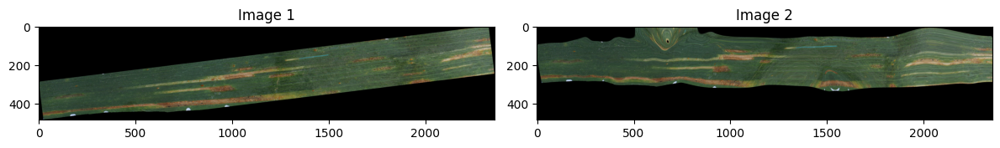

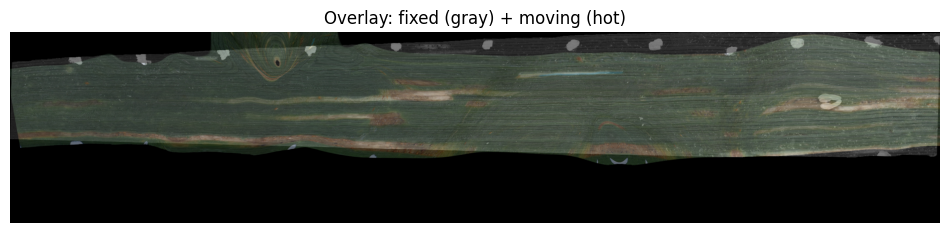

In [ ]:
threshold = 0.5
out_og, _ = tps_skimage_confidence(mkpts0, mkpts1, confidence, threshold, img_moving, verbose=True)
_=plot_image_pair(img_moving, out_og)
_=plot_overlay(img_fixed, out_og)

## Torch-TPS

### Experimenting

In [ ]:
def increase_ctrl_points():
    """Generate ctrl points that increase the center of the image.

    (In proportion of the desired shapes)
    """
    input_ctrl = torch.tensor(
        [
            [0.25, 0.25],  # (i_0, j_0)
            [0.25, 0.75],  # (i_0, j_1)
            [0.75, 0.25],  # (i_1, j_0)
            [0.75, 0.75],  # (i_1, j_1)
        ]
    )

    output_ctrl = torch.tensor(
        [
            [0.15, 0.15],
            [0.15, 0.85],
            [0.85, 0.15],
            [0.85, 0.85],
        ]
    )

    corners = torch.tensor(  # Add corners ctrl points
        [
            [0.0, 0.0],
            [1.0, 0.0],
            [0.0, 1.0],
            [1.0, 1.0],
        ]
    )

    return torch.cat((input_ctrl, corners)), torch.cat((output_ctrl, corners))

In [ ]:
from torch_tps import ThinPlateSpline
def torch_tps(target_keypts, moving_keypts, moving_img, alpha=0.5):
    """
    keypoints have format (x,y)
    """
    image = convert_image_to_tensor(moving_img)
    height = image.shape[2]
    width = image.shape[3]
    size = torch.tensor((height, width))

    target_keypts = target_keypts[..., [1, 0]] # meshgrid builder expects (y,x) format
    moving_keypts = moving_keypts[..., [1, 0]]

    # Fit the thin plate spline from output to input
    tps = ThinPlateSpline(alpha)
    tps.fit(target_keypts, moving_keypts)

    # Create the 2d meshgrid of indices for output image
    i = torch.arange(height, dtype=torch.float32)
    j = torch.arange(width, dtype=torch.float32)

    ii, jj = torch.meshgrid(i, j, indexing="ij")
    output_indices = torch.cat((ii[..., None], jj[..., None]), dim=-1)  # Shape (H, W, 2)

    # Transform it into the input indices
    input_indices = tps.transform(output_indices.reshape(-1, 2)).reshape(height, width, 2)

    # Interpolate the resulting image
    grid = 2 * input_indices / size - 1  # Into [-1, 1]
    grid = torch.flip(grid, (-1,))  # Grid sample works with x,y coordinates, not i, j
    warped = torch.nn.functional.grid_sample(image, grid[None, ...], align_corners=False)[0]

    return warped


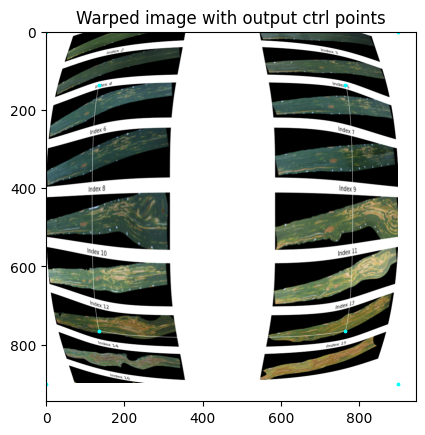

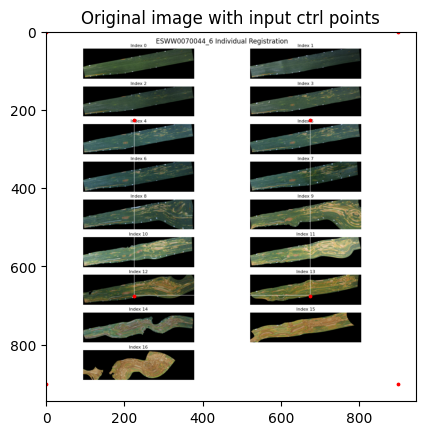

In [ ]:
from PIL import Image, ImageDraw 
image = Image.open("temp/ESWW0070044_6_individual.png").convert("RGB")
width, height = image.size
ImageDraw.Draw(image).rectangle([width * 0.25, height * 0.25, width * 0.75, height * 0.75])

size = torch.tensor((height, width))
# Build control points
input_ctrl, output_ctrl = increase_ctrl_points()
input_ctrl *= size # input <=> coords of landmarks in original moving image
output_ctrl *= size # output <=> target coords, i.e. coords of landmarks in warped image

warped = torch_tps(output_ctrl, input_ctrl, image)


plt.figure()
plt.imshow(K.tensor_to_image(warped))
plt.scatter(output_ctrl[:,1], output_ctrl[:,0], color='cyan', s=3, label="output")
plt.title("Warped image with output ctrl points")

plt.figure()
plt.imshow(image)
plt.scatter(input_ctrl[:,1], input_ctrl[:,0], color='red', s=3, label="input")
plt.title("Original image with input ctrl points")

plt.show()

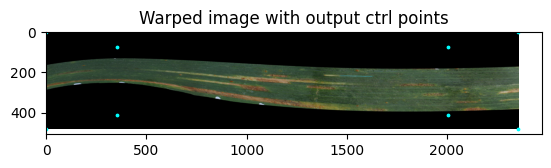

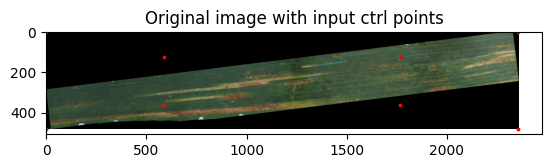

In [ ]:
height = img_moving.shape[2]
width = img_moving.shape[3]
size = torch.tensor((height, width))

# Build control points
input_ctrl, output_ctrl = increase_ctrl_points()
input_ctrl *= size # input <=> coords of landmarks in original moving image
output_ctrl *= size # output <=> target coords, i.e. coords of landmarks in warped image

warped = torch_tps(output_ctrl, input_ctrl, img_moving)


plt.figure()
plt.imshow(K.tensor_to_image(warped))
plt.scatter(output_ctrl[:,1], output_ctrl[:,0], color='cyan', s=3, label="output")
plt.title("Warped image with output ctrl points")

plt.figure()
plt.imshow(K.tensor_to_image(img_moving))
plt.scatter(input_ctrl[:,1], input_ctrl[:,0], color='red', s=3, label="input")
plt.title("Original image with input ctrl points")

plt.show()

### Registration Function

torch.Size([387, 2])


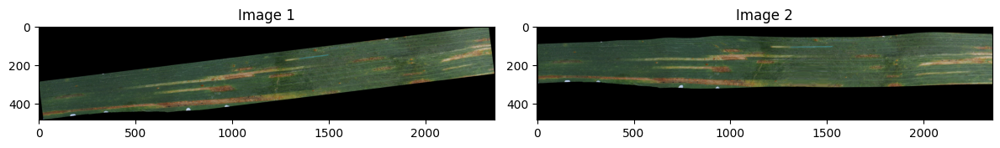

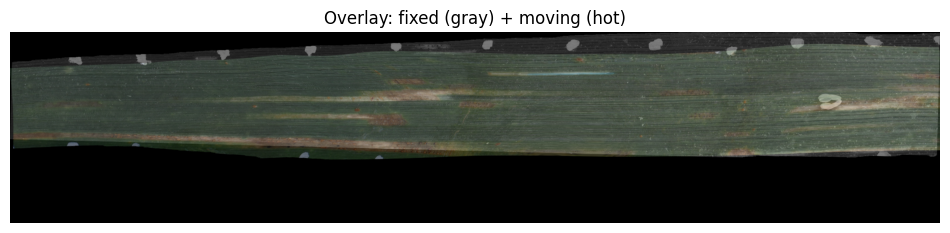

In [ ]:
# Control points
# threshold = 0.95705032704
threshold = 0.5
moving_keypts = mkpts1[confidence > threshold] # coordinates in (x,y) format
target_keypts = mkpts0[confidence > threshold]
print(moving_keypts.shape)

out = torch_tps(target_keypts, moving_keypts, img_moving, alpha=1e5)

# plotting result
_=plot_image_pair(img_moving, out)
_=plot_overlay(img_fixed, out)

torch.Size([504, 2])


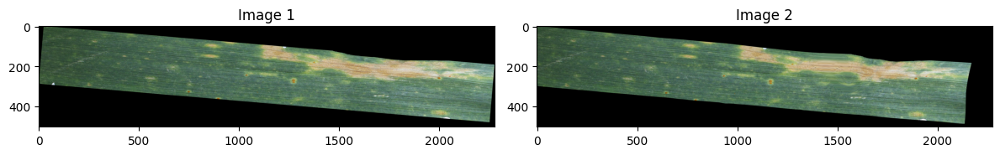

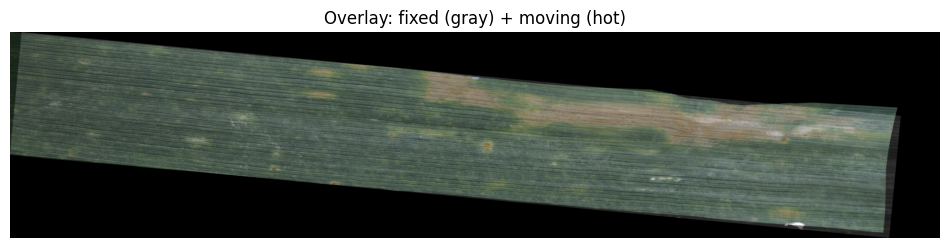

In [ ]:
# Control points
# threshold = 0.95705032704
threshold = 0.92
moving_keypts = mkpts1[confidence > threshold] # coordinates in (x,y) format
target_keypts = mkpts0[confidence > threshold]
print(moving_keypts.shape)

out2 = torch_tps(target_keypts, moving_keypts, img_moving, alpha=0.9)

# plotting result
_=plot_image_pair(img_moving, out2)
_=plot_overlay(img_fixed, out2)

In [ ]:
def normalize(t):
    t_min = t.min()
    t_max = t.max()

    return (t- t_min)/(t_max-t_min) 

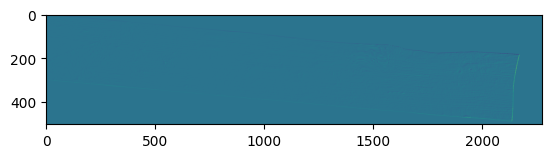

In [ ]:
plt.imshow(K.tensor_to_image(K.color.rgb_to_grayscale(normalize(out-out2)), ))
plt.show()
# smoothing doesn't make a *big* differnce here, but it does make a difference

### Warping Keypoints

In [4]:
kpts0, kpts1 = filter_matches_by_confidence(mkpts0, mkpts1, confidence)
tps = fit_tps_torch(kpts0, kpts1, alpha=100)
warped_img = warp_tps_torch(tps, img_moving)

In [5]:
tps_inv = fit_tps_torch(kpts1, kpts0, alpha=100)
warped_kpts = tps_inv.transform(kpts1)

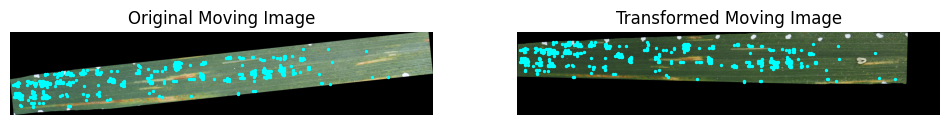

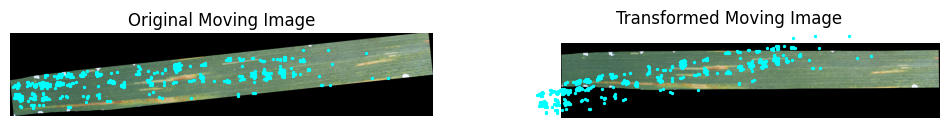

In [6]:
_=plot_img_transform(img_moving, img_fixed, plot_keypts=True, keypts_mov=kpts1, keypts_warped=kpts0)
_=plot_img_transform(img_moving, warped_img, plot_keypts=True, keypts_mov=kpts1, keypts_warped=warped_kpts)

In [1]:
def warp_tps_points_torch(tps, points):
    points = points[..., [1, 0]] # tps was trained in (y,x) format
    return tps.transform(points)[..., [1, 0]] # return output back in (x,y) format

In [ ]:
tps_inv = fit_tps_torch(kpts1, kpts0, alpha=100)

kpts0_01 = warp_tps_points_torch(tps, kpts0)
kpts1_01 = warp_tps_points_torch(tps, kpts1)
kpts0_10 = warp_tps_points_torch(tps_inv, kpts0)
kpts1_10 = warp_tps_points_torch(tps_inv, kpts1)

warped_fixed = warp_tps_torch(tps_inv, img_fixed)

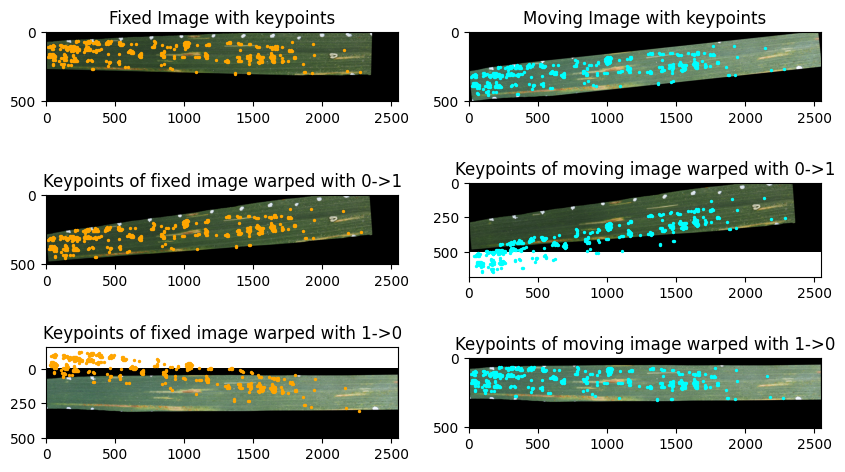

In [9]:
fig, ax= plt.subplots(3,2, figsize=(10,6))

ax[0,0].imshow(K.tensor_to_image(img_fixed))
ax[0,0].scatter(kpts0[:,0], kpts0[:,1], s=2, color='orange')
ax[0,0].set_title("Fixed Image with keypoints")
ax[0,1].imshow(K.tensor_to_image(img_moving))
ax[0,1].scatter(kpts1[:,0], kpts1[:,1], s=2, color='cyan')
ax[0,1].set_title("Moving Image with keypoints")

ax[1,0].imshow(K.tensor_to_image(warped_fixed))
ax[1,0].scatter(kpts0_01[:, 0], kpts0_01[:, 1], s=2, color='orange')
ax[1,0].set_title("Keypoints of fixed image warped with 0->1")
ax[1,1].imshow(K.tensor_to_image(warped_fixed))
ax[1,1].scatter(kpts1_01[:, 0], kpts1_01[:, 1], s=2, color='cyan')
ax[1,1].set_title("Keypoints of moving image warped with 0->1")

ax[2,0].imshow(K.tensor_to_image(warped_img))
ax[2,0].scatter(kpts0_10[:, 0], kpts0_10[:, 1], s=2, color='orange')
ax[2,0].set_title("Keypoints of fixed image warped with 1->0")
ax[2,1].imshow(K.tensor_to_image(warped_img))
ax[2,1].scatter(kpts1_10[:, 0], kpts1_10[:, 1], s=2, color='cyan')
ax[2,1].set_title("Keypoints of moving image warped with 1->0")
plt.show()

### With Filtered Landmarks

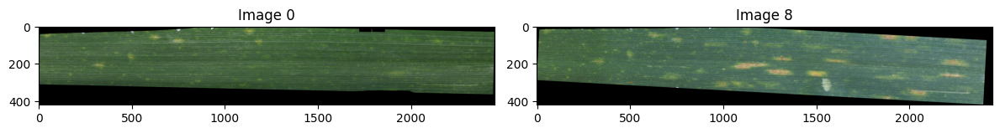

In [ ]:
leaf2 = LeafDataset(
    base_dir='../../leaf-image-sequences',
    leaf_uid="ESWW0070020_1",
    # leaf_uid="ESWW0070023_6", # has much missing data 
    load=('roi_leaf_masks'),
    # load=('target_images', 'target_masks', 'leaf_masks', 'seg_masks', 'det_masks', 'cropped_images', 'rois', 'images', 'keypoints', 'roi_leaf_masks'),
    verbose=False
)

ind = 8
img_fixed, mask_fixed = fetch_image_mask_pair(leaf2, 0, img_scale="roi")
img_moving, mask_moving = fetch_image_mask_pair(leaf2, ind, img_scale="roi")
img_fixed, img_moving, mask_fixed, mask_moving = match_sizes_resize(img_fixed, img_moving, mask_fixed, mask_moving)
_ = plot_image_pair(img_fixed, img_moving, 0, ind)

Total matches: 4984
Matches with Confidence > 0.5: 3009
Inliers: 1141 (22.89%)


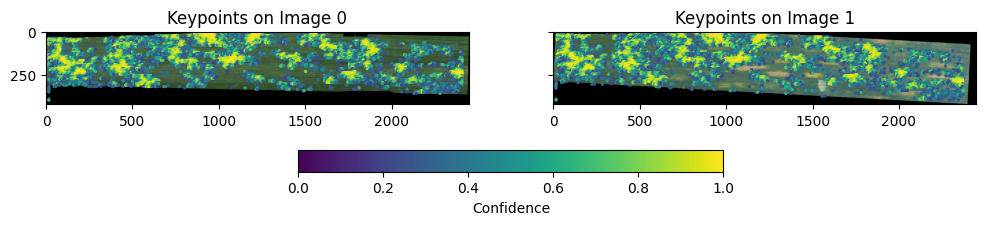

In [ ]:
# get loftr matches
mkpts0, mkpts1, confidence, inliers, n_matches = loftr_match(img_fixed, img_moving, verbose=True, return_n_matches=True)
_ = plot_match_coverage(img_fixed, mkpts0, img_moving, mkpts1, confidence)

Number of Matches: 277


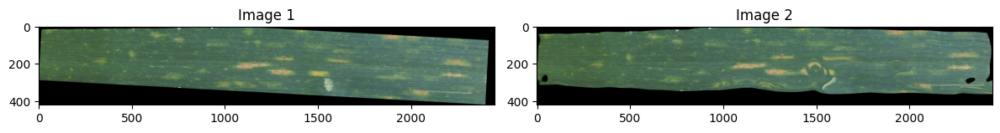

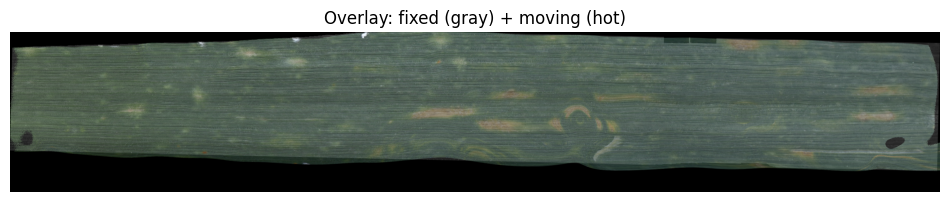

In [ ]:
from leafalignment.loftr import filter_matches_by_grid

cell_size=50
threshold=0.5
alpha = 0.9
cell_matches_fix, cell_matches_mov = filter_matches_by_grid(mkpts0, mkpts1, confidence, img_width=img_fixed.shape[3], cell_size=cell_size, threshold=threshold)
print(f"Number of Matches: {cell_matches_fix.shape[0]}")
out = torch_tps(cell_matches_fix, cell_matches_mov, img_moving, alpha)
_=plot_image_pair(img_moving, out)
_=plot_overlay(img_fixed, out)

### Analysis

- Number of keypoints
- Distribution of keypoints (even/uneven)
- Extrapolation (i.e. no points near edges)

In [6]:
img_og = img_moving
mask_og = mask_moving

#### Fake Keypoint Generation

In [7]:
n = 500

500


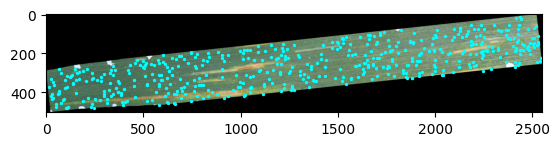

In [174]:
def sample_landmarks_uniform(mask, n):
    """
    Uniformly sample n points inside mask
    returns (n,2) tensor in (x,y) format
    """
    ys, xs = torch.where(mask[0,0,:] > 0)
    idx = torch.randint(0, len(xs), (n,))
    
    pts = torch.stack([xs[idx], ys[idx]], dim=1).float()
    return pts

sample_keypoints_uniform = sample_landmarks_uniform(mask_og, n)
print(len(sample_keypoints_uniform))
plt.imshow(K.tensor_to_image(img_og))
plt.scatter(sample_keypoints_uniform[:,0], sample_keypoints_uniform[:,1], s=2, color='cyan')
plt.show()

497


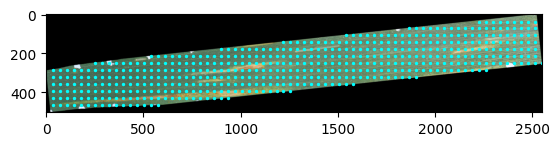

In [8]:
import math
def sample_landmarks_grid(mask, n):
    mask = mask[0,0,:]
    H, W = mask.shape
    valid_area = torch.sum(mask)
    total_area = H * W
    coverage = valid_area / total_area
    ratio = H/W

    # points that fall outside the mask are lost -> generate more points to account for this
    N = n / coverage
    kW = math.ceil( (N/ratio)**0.5)
    kH = math.ceil(ratio*kW)
    
    xs = torch.linspace(0, W-1, kW) 
    ys = torch.linspace(0, H-1, kH)
    
    grid_x, grid_y = torch.meshgrid(xs, ys, indexing="xy")
    pts = torch.stack([grid_x.flatten(), grid_y.flatten()], dim=1)

    mask_values = mask[pts[:,1].long(), pts[:,0].long()]
    pts = pts[mask_values > 0]

    return pts[:n]

sample_keypoints_grid = sample_landmarks_grid(mask_og, n)
print(len(sample_keypoints_grid))
plt.imshow(K.tensor_to_image(img_og))
plt.scatter(sample_keypoints_grid[:,0], sample_keypoints_grid[:,1], s=2, color='cyan')
plt.show()

467


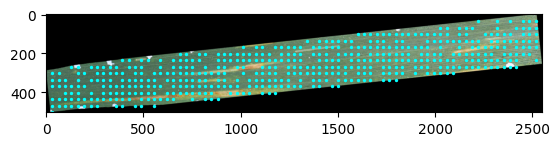

In [173]:
def sample_landmarks_grid_holes(mask, n, loss_ratio: float=0.2):
    n_loss = math.ceil(n*loss_ratio)
    pts = sample_landmarks_grid(mask, n+n_loss)
    
    n = len(pts)
    n_loss = math.ceil(n*loss_ratio)
    perm = torch.randperm(n)
    pts = pts[perm]


    return pts[:n-n_loss]

sample_keypoints_grid_holes = sample_landmarks_grid_holes(mask_og, n)
print(len(sample_keypoints_grid_holes))
plt.imshow(K.tensor_to_image(img_og))
plt.scatter(sample_keypoints_grid_holes[:,0], sample_keypoints_grid_holes[:,1], s=2, color='cyan')
plt.show()

422


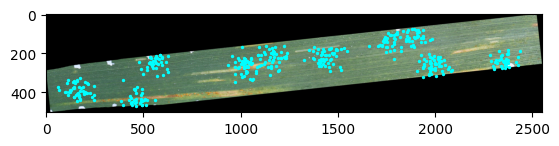

In [172]:
def sample_landmarks_clustered(mask, n, clusters=10, std=40):
    mask = mask[0,0,:]
    H, W = mask.shape
    
    if n<50 and clusters==10:
        clusters=5
    ys, xs = torch.where(mask > 0)
    centers_idx = torch.randint(0, len(xs), (clusters,))
    centers = torch.stack([xs[centers_idx], ys[centers_idx]], dim=1).float()

    pts = []

    for i in range(n):
        c = centers[torch.randint(0, clusters, (1,))]
        p = c + torch.randn(2) * std

        # print(p)

        x = torch.clamp(p[0,0], 0, W-1)
        y = torch.clamp(p[0,1], 0, H-1)

        if mask[int(y), int(x)]:
            pts.append(torch.tensor([x,y]))

    return torch.stack(pts)

sample_keypoints_clustered = sample_landmarks_clustered(mask_og, n)
print(len(sample_keypoints_clustered))
plt.imshow(K.tensor_to_image(img_og))
plt.scatter(sample_keypoints_clustered[:,0], sample_keypoints_clustered[:,1], s=2, color='cyan')
plt.show()

#### Fake Transformation

In [88]:
pts_t.shape

torch.Size([193, 2])

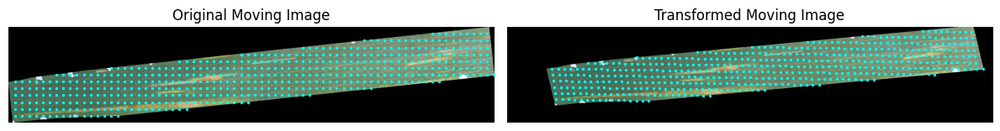

In [45]:
import kornia.augmentation as KA

def random_affine_warp(img, pts):
    affine_warp = KA.AugmentationSequential(
        KA.RandomAffine(
            degrees=20,
            translate=(0.1, 0.1),
            scale=(0.9, 1.1),
            shear=(-10., 10.),
            p=1.0,
        ),
        data_keys=["input", "keypoints"],
    )

    H,W = img.shape[2:]
    # make sure no points leave the image domain
    while True:
        img_t, pts_t = affine_warp(img, pts)

        valid = (
            (pts_t[...,0] >= 0) &
            (pts_t[...,0] < W) &
            (pts_t[...,1] >= 0) &
            (pts_t[...,1] < H)
        )

        if valid.all():
            return img_t, pts_t
    # return img, pts

img_warp_affine, pts_affine = random_affine_warp(img_og, sample_keypoints_grid)

_=plot_img_transform(img_og, img_warp_affine, plot_keypts=True, keypts_mov=sample_keypoints_grid, keypts_warped=pts_affine)

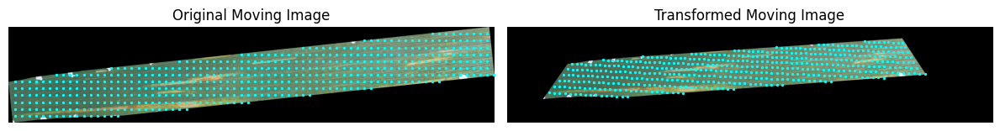

In [46]:
def random_homography_warp(img, pts):
    homography_warp = KA.AugmentationSequential(
        KA.RandomPerspective(
            distortion_scale=0.5,
            p=1.0,
        ),
        data_keys=["input", "keypoints"],
    )
    return homography_warp(img, pts)

img_warp_homography, pts_homography = random_homography_warp(img_og, sample_keypoints_grid)

_=plot_img_transform(img_og, img_warp_homography, plot_keypts=True, keypts_mov=sample_keypoints_grid, keypts_warped=pts_homography)

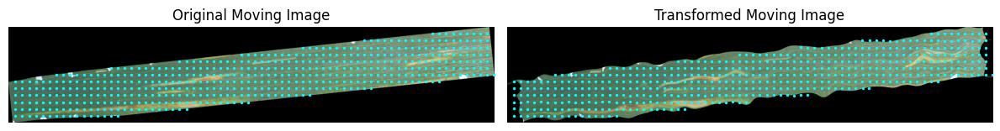

In [66]:
import torch.nn.functional as F
def random_elastic_warp(img, pts, kernel_size=151, sigma=30.0, alpha=6.0):
    """
    img : (B,C,H,W)
    pts : (N,2) or (B,N,2)  pixel coordinates (x,y)
    """

    B, C, H, W = img.shape

    # ensure batch dimension for points
    if pts.dim() == 2:
        pts = pts.unsqueeze(0)

    Bp, N, _ = pts.shape
    assert Bp == B, "points batch size must match image batch"

    # apply elastic to image

    elastic_warp = KA.RandomElasticTransform(
        kernel_size=(kernel_size,kernel_size),
        sigma=(sigma,sigma),
        alpha=(alpha,alpha),
        p=1.0
    )
    img_t = elastic_warp(img)

    # displacement field sampled by augmentation
    disp = elastic_warp._params["noise"]  # (B,2,H,W)

    # normalize points to [-1,1]
    pts_norm = pts.clone()
    pts_norm[...,0] = 2 * (pts[...,0] / (W - 1)) - 1
    pts_norm[...,1] = 2 * (pts[...,1] / (H - 1)) - 1

    # grid_sample requires (B,H_out,W_out,2)
    grid = pts_norm.unsqueeze(2)   # (B,N,1,2)

    sampled_disp = F.grid_sample(
        disp,
        grid,
        mode="bilinear",
        align_corners=True
    )  # -> (B,2,N,1)

    sampled_disp = sampled_disp.squeeze(-1).permute(0,2,1)  # (B,N,2)

    pts_t = pts + sampled_disp

    return img_t, pts_t.squeeze(0)
    

img_warp_elastic, pts_elastic = random_elastic_warp(img_og, sample_keypoints_grid)

_=plot_img_transform(img_og, img_warp_elastic, plot_keypts=True, keypts_mov=sample_keypoints_grid, keypts_warped=pts_elastic)

In [67]:
torch.sum(torch.abs(sample_keypoints_grid-pts_elastic))
# => there is actually a difference

tensor(315.7798)

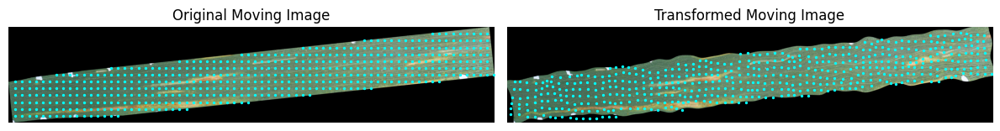

In [79]:
import kornia.filters as KF
def random_elastic_warp_manual(img, pts, kernel_size=251, sigma=30.0, alpha=700.0, device=None):
    """
    img : (B,C,H,W) tensor
    pts : (B,N,2) or (N,2) pixel coordinates (x,y)
    sigma : smoothing for displacement
    alpha : displacement magnitude
    """
    if device is None:
        device = img.device

    B, C, H, W = img.shape

    # ensure batch dimension
    if pts.dim() == 2:
        pts = pts.unsqueeze(0)
    Bp, N, _ = pts.shape
    assert Bp == B, "Batch size of points must match image"

    # generate smooth displacement
    disp = torch.randn(B, 2, H, W, device=device)
    disp = KF.gaussian_blur2d(disp, kernel_size=(kernel_size,kernel_size), sigma=(sigma,sigma))
    disp = disp * alpha

    # warp image
    # build normalized grid
    yy, xx = torch.meshgrid(torch.arange(H, device=device), torch.arange(W, device=device), indexing="ij")
    grid = torch.stack([xx, yy], dim=-1).float().unsqueeze(0).repeat(B,1,1,1)  # (B,H,W,2)
    grid = grid + disp.permute(0,2,3,1)
    grid_norm = grid.clone()
    grid_norm[...,0] = 2.0*(grid[...,0]/(W-1)) - 1.0
    grid_norm[...,1] = 2.0*(grid[...,1]/(H-1)) - 1.0
    img_t = F.grid_sample(img, grid_norm, align_corners=True)

    # warp points
    pts_norm = pts.clone()
    pts_norm[...,0] = 2*(pts[...,0]/(W-1)) - 1
    pts_norm[...,1] = 2*(pts[...,1]/(H-1)) - 1
    pts_grid = pts_norm.unsqueeze(2)  # (B,N,1,2)

    sampled_disp = F.grid_sample(disp, pts_grid, align_corners=True, mode="bilinear")
    sampled_disp = sampled_disp.squeeze(-1).permute(0,2,1)  # (B,N,2)

    pts_t = pts + sampled_disp

    return img_t, pts_t.squeeze(0)

img_warp_elastic, pts_elastic = random_elastic_warp_manual(img_og, sample_keypoints_grid)

_=plot_img_transform(img_og, img_warp_elastic, plot_keypts=True, keypts_mov=sample_keypoints_grid, keypts_warped=pts_elastic)

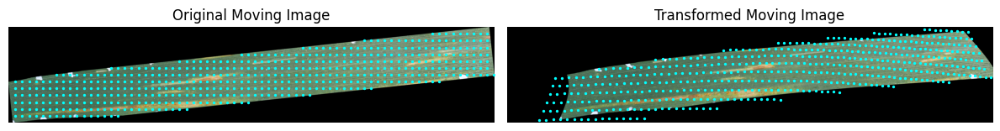

In [ ]:
import kornia.geometry.transform as KT
def random_tps_warp(img, pts, scale:float=0.3):

    B, C, H, W = img.shape
    pts = pts.unsqueeze(0)

    tps_warp = KA.RandomThinPlateSpline(
        scale=scale,
        p=1.0
    )
    while True:
        # warp image
        img_t = tps_warp(img)

        params = tps_warp._params

        src = params["src"]
        dst = params["dst"]

        # compute TPS transform
        kernel, affine = KT.get_tps_transform(src, dst)

        # convert points to normalized coordinates
        pts_norm = pts.clone()
        pts_norm[...,0] = 2*(pts[...,0]/(W-1)) - 1
        pts_norm[...,1] = 2*(pts[...,1]/(H-1)) - 1

        # warp points
        pts_norm_t = KT.warp_points_tps(
            pts_norm,
            src,
            kernel,
            affine
        )

        # back to pixel coordinates
        pts_t = pts_norm_t.clone()
        pts_t[...,0] = (pts_norm_t[...,0]+1)*0.5*(W-1)
        pts_t[...,1] = (pts_norm_t[...,1]+1)*0.5*(H-1)

        pts_t=pts_t.squeeze(0)

        valid = (
                (pts_t[...,0] >= 0) &
                (pts_t[...,0] < W) &
                (pts_t[...,1] >= 0) &
                (pts_t[...,1] < H)
            )

        if valid.all():
            return img_t, pts_t

img_warp_tps, pts_tps = random_tps_warp(img_og, sample_keypoints_grid)

_=plot_img_transform(img_og, img_warp_tps, plot_keypts=True, keypts_mov=sample_keypoints_grid, keypts_warped=pts_tps)

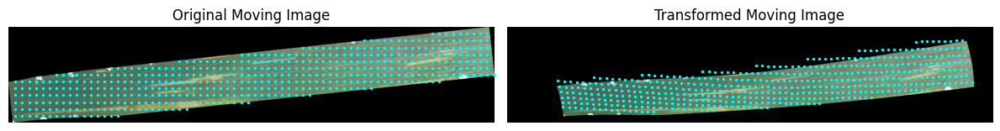

In [98]:
def random_tps_warp_manual(img, pts, scale=0.3):
    """
    img : (B,C,H,W)
    pts : (N,2) pixel coordinates
    """
    B, C, H, W = img.shape
    pts = pts.unsqueeze(0)  # (1,N,2)

    tps_warp = KA.RandomThinPlateSpline(scale=scale, p=1.0)

    while True:
        # img_t, pts_t = affine_warp(img, pts)
            
        img_t = tps_warp(img)

        # these are already scaled correctly internally
        params = tps_warp._params
        src = params["src"]  # (B,K,2)
        dst = params["dst"]  # (B,K,2)

        # compute TPS in Kornia using pixel coordinates directly
        kernel, affine = KT.get_tps_transform(src, dst)

        # normalize landmarks to [-1,1] for warp_points_tps
        pts_norm = pts.clone()
        pts_norm[...,0] = 2*(pts[...,0]/(W-1)) - 1
        pts_norm[...,1] = 2*(pts[...,1]/(H-1)) - 1

        # warp points
        pts_norm_t = KT.warp_points_tps(pts_norm, src, kernel, affine)

        # convert back to pixel coordinates
        pts_t = pts_norm_t.clone()
        pts_t[...,0] = (pts_norm_t[...,0]+1)*0.5*(W-1)
        pts_t[...,1] = (pts_norm_t[...,1]+1)*0.5*(H-1)

        pts_t=pts_t.squeeze(0)

        valid = (
                (pts_t[...,0] >= 0) &
                (pts_t[...,0] < W) &
                (pts_t[...,1] >= 0) &
                (pts_t[...,1] < H)
            )

        if valid.all():
            return img_t, pts_t


img_warp_tps_manual, pts_tps_manual = random_tps_warp_manual(img_og, sample_keypoints_grid)

_=plot_img_transform(img_og, img_warp_tps_manual, plot_keypts=True, keypts_mov=sample_keypoints_grid, keypts_warped=pts_tps_manual)

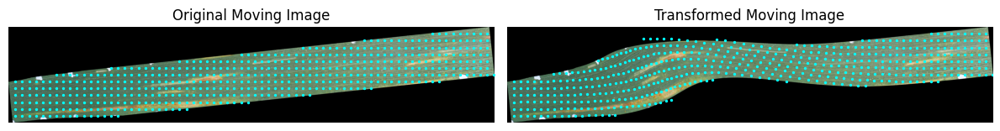

In [127]:
def line_drag_warp(
    img,                # (B, C, H, W)
    points,             # (B, N, 2) in pixel coords (x, y)
    magnitude=0.5,
    sigma=0.25,
    p0=(-0.3, -0.5),     # start (normalized coords)
    p1=(0.0, 0.5),      # end (normalized coords)
):
    device = img.device
    B, C, H, W = img.shape

    # Base grid
    grid = K.utils.create_meshgrid(H, W, normalized_coordinates=True)
    grid = grid.to(device).repeat(B, 1, 1, 1)

    x = grid[..., 0]
    y = grid[..., 1]

    # Line-based displacement field
    x0, y0 = p0
    x1, y1 = p1

    vx = x1 - x0
    vy = y1 - y0

    t = ((x - x0)*vx + (y - y0)*vy) / (vx*vx + vy*vy + 1e-8)
    t = t.clamp(0, 1)

    proj_x = x0 + t * vx
    proj_y = y0 + t * vy

    dist2 = (x - proj_x)**2 + (y - proj_y)**2
    weight = torch.exp(-dist2 / (2 * sigma**2))

    direction = torch.tensor([vx, vy], device=device)
    direction = direction / (direction.norm() + 1e-8)

    dx, dy = direction

    disp_x = weight * dx * magnitude
    disp_y = weight * dy * magnitude

    disp = torch.stack([disp_x, disp_y], dim=1)  # (B, 2, H, W)

    # Warp image
    warped_grid = grid + disp.permute(0, 2, 3, 1)

    warped_img = F.grid_sample(
        img,
        warped_grid,
        mode='bilinear',
        padding_mode='border',
        align_corners=True
    )

    # Warp points
    px = points[..., 0] / (W - 1) * 2 - 1
    py = points[..., 1] / (H - 1) * 2 - 1
    points_norm = torch.stack([px, py], dim=-1)

    sample_grid = points_norm.view(B, -1, 1, 2)

    sampled_disp = F.grid_sample(
        disp,
        sample_grid,
        mode='bilinear',
        align_corners=True
    )

    sampled_disp = sampled_disp.squeeze(-1).permute(0, 2, 1)

    warped_points_norm = points_norm - sampled_disp

    # back to pixel coords
    x_w = (warped_points_norm[..., 0] + 1) * (W - 1) / 2
    y_w = (warped_points_norm[..., 1] + 1) * (H - 1) / 2

    warped_points = torch.stack([x_w, y_w], dim=-1)

    return warped_img, warped_points.squeeze(0)

img_warp_line, pts_line = line_drag_warp(img_og, sample_keypoints_grid)

_=plot_img_transform(img_og, img_warp_line, plot_keypts=True, keypts_mov=sample_keypoints_grid, keypts_warped=pts_line)

#### Adding Noise

In [142]:
pts_line_noise.shape

torch.Size([1, 497, 2])

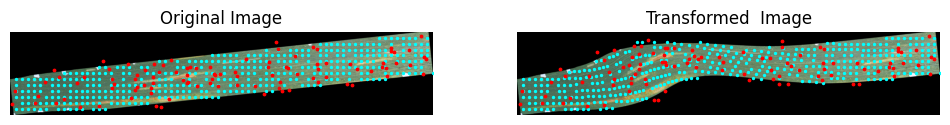

In [155]:
def add_noise(pts1, pts2, n_noise_ratio: float=0.2, max_mag: float=100, return_noise_mask: bool=False):
    if pts1.dim() == 2:
        pts1 = pts1.unsqueeze(0)
    if pts2.dim()==2:
        pts2 = pts2.unsqueeze(0)

    B, N, _ = pts1.shape

    # number of points to move
    k = int(n_noise_ratio * N)

    # sample indices 
    perm = torch.randperm(N)
    idx = perm[:k]

    # random displacements
    disp = (torch.rand(B, k, 2) * 2 - 1) * max_mag

    # clone inputs
    pts1_new = pts1.clone()
    pts2_new = pts2.clone()

    # apply displacement
    pts1_new[:, idx] += disp
    pts2_new[:, idx] += disp

    # create mask (for visualization)
    moved_mask = torch.zeros(N, dtype=torch.bool)
    moved_mask[idx] = True

    if return_noise_mask:
        return pts1_new.squeeze(0), pts2_new.squeeze(0), moved_mask
    else:
        return pts1_new.squeeze(0), pts2_new.squeeze(0)


sample_keypoints_grid_noise, pts_line_noise, noise_mask = add_noise(sample_keypoints_grid, pts_line, n_noise_ratio=0.2, max_mag=50, return_noise_mask=True)


fig, axs = plt.subplots(1, 2, figsize=(12,6))

axs[0].imshow(K.tensor_to_image(img_og))
axs[0].scatter(sample_keypoints_grid_noise[~noise_mask,0], sample_keypoints_grid_noise[~noise_mask,1], c='cyan', s=2)
axs[0].scatter(sample_keypoints_grid_noise[noise_mask,0], sample_keypoints_grid_noise[noise_mask,1], c='red', s=3)
axs[0].set_title("Original Image")
axs[0].axis('off')

axs[1].imshow(K.tensor_to_image(img_warp_line))
# axs[1].scatter(pts_line[:, 0], pts_line[:, 1], s=2, color='cyan')
axs[1].scatter(pts_line_noise[~noise_mask,0], pts_line_noise[~noise_mask,1], c='cyan', s=2)
axs[1].scatter(pts_line_noise[noise_mask,0], pts_line_noise[noise_mask,1], c='red', s=3)
axs[1].set_title("Transformed  Image")
axs[1].axis('off')
# fig.suptitle(title, fontsize=20, y=0.7)
plt.show()

#### Plotting Utility

In [101]:
def plot_img_transform_tests(img_og, img_mov, img_mov_warped, plot_keypts: bool=False, keypts_og=None, keypts_mov=None, keypts_warped=None, title: str=None):
    """
    plots original moving image and transformed moving image
    """

    # kornia and torch expect C x H x W, while skimage & matplotlib expect H x W x C
    if type(img_og) == torch.Tensor:
        img_og = K.tensor_to_image(img_og)
    if type(img_mov) == torch.Tensor:
        img_mov = K.tensor_to_image(img_mov)
    if type(img_mov_warped) == torch.Tensor:
        img_mov_warped = K.tensor_to_image(img_mov_warped)


    fig, axs = plt.subplots(1, 3, figsize=(12,6))

    axs[0].imshow(img_og)
    if plot_keypts and (keypts_og is not None):
        axs[0].scatter(keypts_og[:, 0], keypts_og[:, 1], s=2, color='cyan', alpha=0.5)
    axs[0].set_title("Original Moving Image")
    axs[0].axis('off')
    axs[1].imshow(img_mov)
    if plot_keypts and (keypts_mov is not None):
        axs[1].scatter(keypts_mov[:, 0], keypts_mov[:, 1], s=2, color='cyan', alpha=0.5)
    axs[1].set_title("Original Moving Image")
    axs[1].axis('off')
    axs[2].imshow(img_mov_warped)
    if plot_keypts and (keypts_warped is not None):
        axs[2].scatter(keypts_warped[:, 0], keypts_warped[:, 1], s=2, color='cyan', alpha=0.5)
    axs[2].set_title("Transformed Moving Image")
    axs[2].axis('off')
    if title is not None:
        fig.suptitle(title, fontsize=18, y=0.65)

    plt.tight_layout()

    return fig, axs

#### Evaluation

/tmp/ipykernel_257/2098330246.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 3, figsize=(12,6))


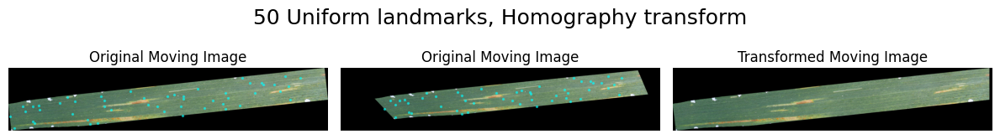

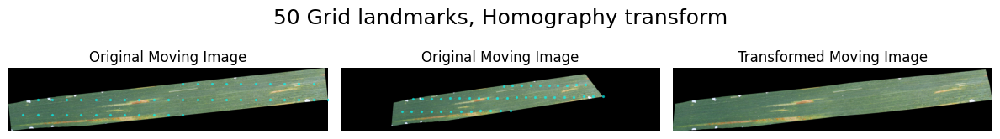

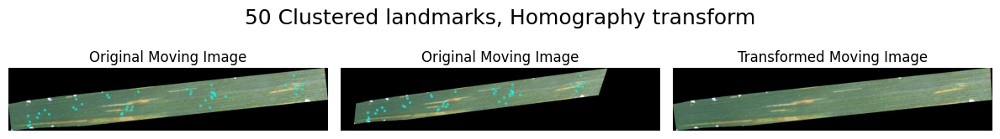

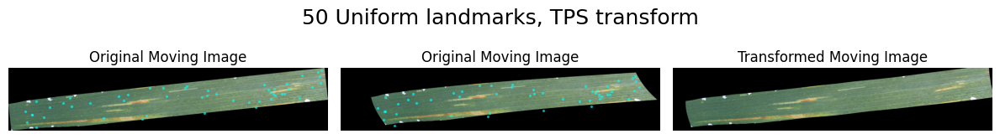

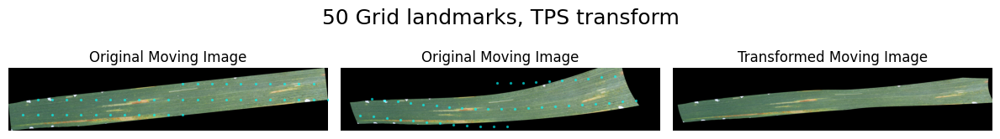

...

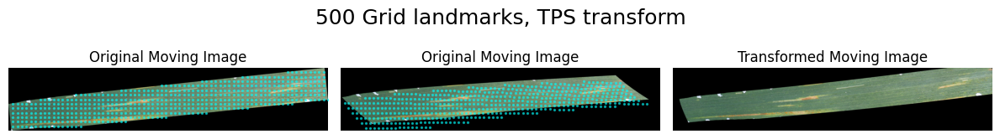

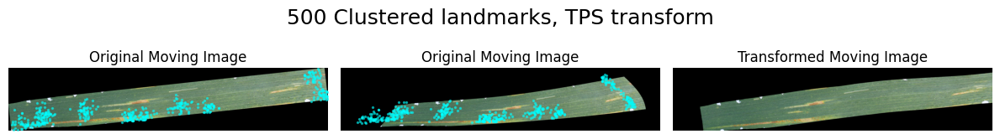

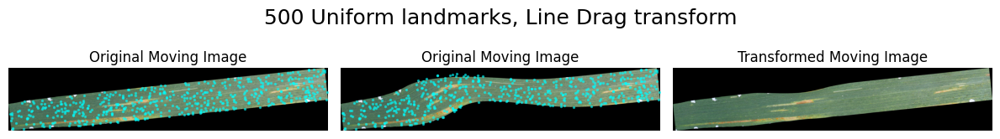

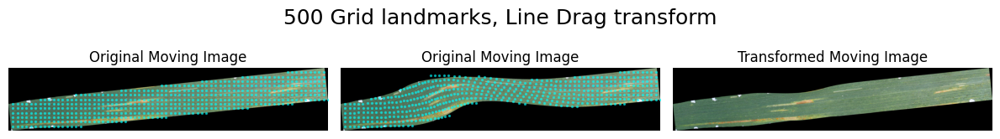

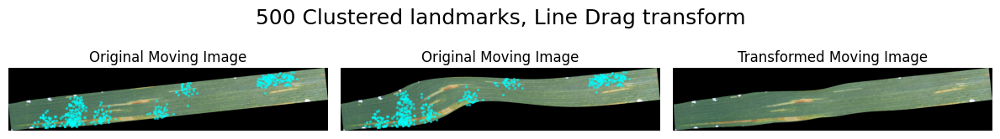

In [169]:
alphas = [0]#[0, 10, 100]
# n_keypoints = [10, 50, 100, 500]
# landmarks = {'Uniform': sample_landmarks_uniform, 'Grid': sample_landmarks_grid, 'Spotty Grid': sample_landmarks_grid_holes, 'Clustered': sample_landmarks_clustered}
# transforms = {'Affine': random_affine_warp, 'Homography': random_homography_warp, 'Elastic': random_elastic_warp_manual, 'TPS': random_tps_warp, 'Line Drag': line_drag_warp}
landmarks = {'Uniform': sample_landmarks_uniform, 'Grid': sample_landmarks_grid, 'Clustered': sample_landmarks_clustered}
transforms = {'Homography': random_homography_warp, 'TPS': random_tps_warp, 'Line Drag': line_drag_warp}
noise_ratio = [0]
noise_magnitude = [0]

#-----noise experiments-------
# n_keypoints = [50, 100, 500]
# landmarks = {'Uniform': sample_landmarks_uniform}
# landmarks = {'Grid': sample_landmarks_grid}
# landmarks = {'Clustered': sample_landmarks_clustered}
# transforms = {'Homography': random_homography_warp}
# transforms = {'Line Drag': line_drag_warp}
# noise_ratio = [0.05, 0.1, 0.2]
# noise_magnitude = [10, 50, 100]
# noise_ratio = [0.01]
# noise_magnitude = [500]

for alpha in alphas:
    for n in n_keypoints:
        for transform_type, transform_funct in transforms.items():
            for landmark_type, sampling_funct in landmarks.items():
                keypts = sampling_funct(mask_og, n)
                moving_img, moving_keypts = transform_funct(img_og, keypts)

                for ratio in noise_ratio:
                    for mag in noise_magnitude:
                        keypts, moving_keypts = add_noise(keypts, moving_keypts, n_noise_ratio=ratio, max_mag=mag)

                        warped_img = torch_tps(keypts, moving_keypts, moving_img, alpha)
                        if ratio > 0:
                            fig, ax = plot_img_transform_tests(img_og, moving_img, warped_img, True, keypts, moving_keypts, None, f"{n} {landmark_type} landmarks, {transform_type} transform, {int(ratio*100)}% noise (Mag={mag})")#, smoothing={alpha}")
                        else:
                            fig, ax = plot_img_transform_tests(img_og, moving_img, warped_img, True, keypts, moving_keypts, None, f"{n} {landmark_type} landmarks, {transform_type} transform")#, smoothing={alpha}")
                        

/tmp/ipykernel_257/2098330246.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 3, figsize=(12,6))


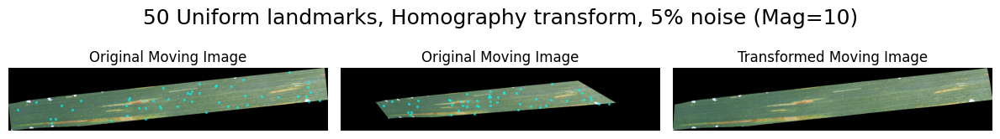

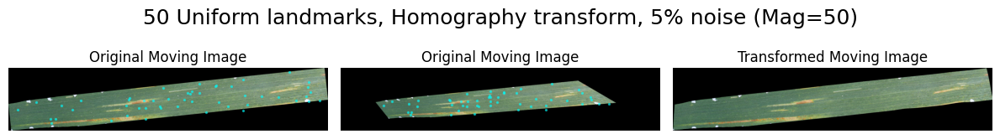

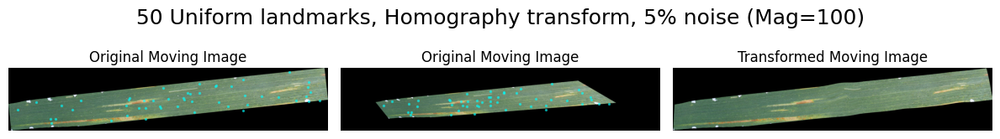

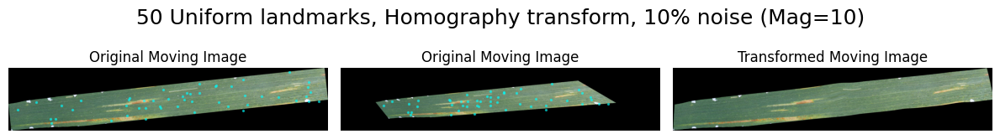

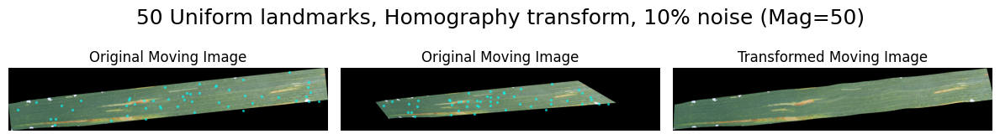

...

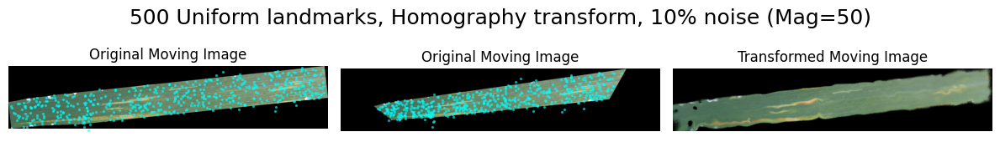

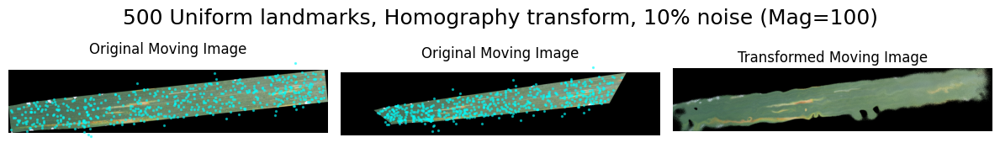

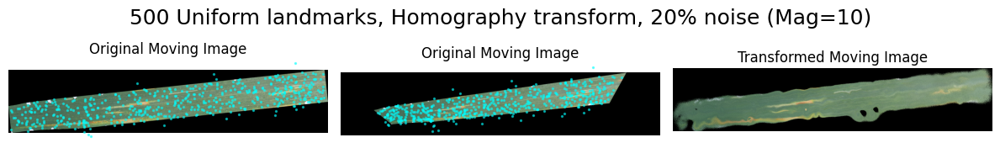

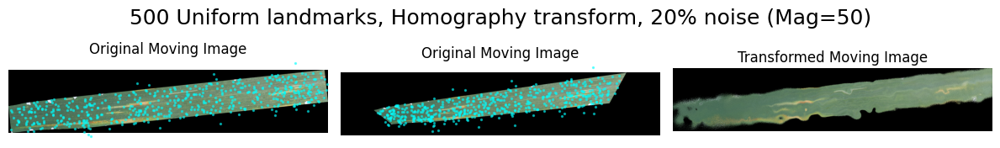

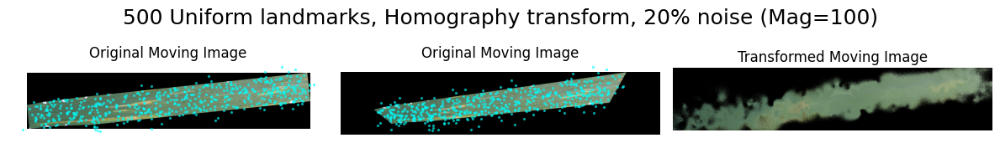

In [168]:
alphas = [0]#[0, 10, 100]
n_keypoints = [10, 50, 100, 500]
# landmarks = {'Uniform': sample_landmarks_uniform, 'Grid': sample_landmarks_grid, 'Spotty Grid': sample_landmarks_grid_holes, 'Clustered': sample_landmarks_clustered}
# transforms = {'Affine': random_affine_warp, 'Homography': random_homography_warp, 'Elastic': random_elastic_warp_manual, 'TPS': random_tps_warp, 'Line Drag': line_drag_warp}
# landmarks = {'Uniform': sample_landmarks_uniform, 'Grid': sample_landmarks_grid, 'Clustered': sample_landmarks_clustered}
# transforms = {'Homography': random_homography_warp, 'TPS': random_tps_warp, 'Line Drag': line_drag_warp}
# noise_ratio = [0]
# noise_magnitude = [0]

#-----noise experiments-------
n_keypoints = [50, 100, 500]
landmarks = {'Uniform': sample_landmarks_uniform}
# landmarks = {'Grid': sample_landmarks_grid}
# landmarks = {'Clustered': sample_landmarks_clustered}
transforms = {'Homography': random_homography_warp}
# transforms = {'Line Drag': line_drag_warp}
noise_ratio = [0.05, 0.1, 0.2]
noise_magnitude = [10, 50, 100]
# noise_ratio = [0.01]
# noise_magnitude = [500]

for alpha in alphas:
    for n in n_keypoints:
        for transform_type, transform_funct in transforms.items():
            for landmark_type, sampling_funct in landmarks.items():
                keypts = sampling_funct(mask_og, n)
                moving_img, moving_keypts = transform_funct(img_og, keypts)

                for ratio in noise_ratio:
                    for mag in noise_magnitude:
                        keypts, moving_keypts = add_noise(keypts, moving_keypts, n_noise_ratio=ratio, max_mag=mag)

                        warped_img = torch_tps(keypts, moving_keypts, moving_img, alpha)
                        if ratio > 0:
                            fig, ax = plot_img_transform_tests(img_og, moving_img, warped_img, True, keypts, moving_keypts, None, f"{n} {landmark_type} landmarks, {transform_type} transform, {int(ratio*100)}% noise (Mag={mag})")#, smoothing={alpha}")
                        else:
                            fig, ax = plot_img_transform_tests(img_og, moving_img, warped_img, True, keypts, moving_keypts, None, f"{n} {landmark_type} landmarks, {transform_type} transform")#, smoothing={alpha}")
                        

**Observations:**  
Affine TF:  
- significant struggles with only 10 LM. does better with uneven distribution than with "grid like structure" (just a line here)
- 50 LM: already pretty good, though struggles with end bits
- 100 LM: looks very good, not stark difference between distributions (except for slight differences at end bits, tho that is in part due to image cropping)
- 500 LM: looks very good


Homography TF:  
- significant struggles with only 10 LM. does better with uneven distribution than with "grid like structure" (just a line here)
- 50 LM: already pretty good, though struggles with edges
- 100 LM: looks very good, not stark difference between distributions (except for slight differences at edges)
- 500 LM: overall very good, but for clustered LMs struggels with end pieces where there were no LMs


Elastic TF:  
- same trends as for homography, but no amount of LMs is sufficient for reverting the wiggles (though this admittedly might be an issue of the transformation implementation)


TPS TF:  
- 10 LM not enough to revert it, though best performance for uneven distribution (clustered) dispite *significant* extrapolation. halfway between even/uneven distribution (uniform) seems to introduce some wiggles
- 50 LM: big improvement, but still struggles for rather even distribution (bc bad distr along edges)
- 100 LM: fairly good results, though there are discrepancies where KP transform doesn't seem to match image TF
- 500 LM: very good results (modulo poor KP alignment). clustered struggled with end-bits that had no LMs  


Line Drag TF:  
- 10 LM: overall fairly poor results. again best performance for most uneven distr
- 50 LM: big improvement. discrepancies where distribution is even, but no LMs along edges. for clustered: poor extrapolation in large empty regions between clusters
- 100 LM: fairly good results, though there are discrepancies where KP transform doesn't seem to match image TF. for clustered: poor extrapolation in large empty regions between clusters
- 500 LM: very good results (modulo poor KP alignment). for clustered: poor extrapolation in large empty regions between clusters

Noise Experiments
- for 10 uniform LMs, noise only starts becoming noticable above 10% Mag=10
- 50 uniform LMs: stark outliers can cause errors (e.g. if far outside leaf).  high noise ratio of sufficient magnitude start causing the familiar "wiggles"
- 100 uniform LMs: strong outliers start causing wiggles. the more outliers and the stronger they are, the more wiggles
- 500 uniform LMs: even at low noise ratio, the edges start dissolving
- at high enough number of points, grid-like distrubtion seems marginally more resistant to noise
- clustered seems a bit more susceptible to noise. if number of noisy points (or magnitude) get too high, the image is completely torn apart
- few but strong outliers can cause an effect. but *very* few *very* strong outliers seem to be mostly compensated


**Conclusions:**  
- large patches with no LMs usually lead to faulty transformations, both in the case of extrapolation and interpolation
- perfectly even alignment is not so important, more that all areas of the leaf are covered
- Affine/Homography transformations seem very easy to correct, more complex deformations are more difficult. 
- if results from elastic transform are to be trusted, the more minute the changes the more difficult
- The over-exaggerated transformations don't seem to stem from the transformation nor the distribution of points, but instead from **bad matches**


## RBF Interpolation

In [ ]:
from scipy.interpolate import RBFInterpolator
from scipy.ndimage import map_coordinates
def tps_scipy(target_keypts, moving_keypts, moving_image, smoothing=1e-3):
    if type(moving_image) != torch.Tensor:
        moving_image = convert_image_to_tensor(moving_image)
    H, W = moving_image.shape[2:]

    # compute displacements
    displacements = moving_keypts - target_keypts

    # build interpolator
    rbf = RBFInterpolator(
        src_pts,
        displacements,
        kernel="thin_plate_spline",
        smoothing=smoothing   # start small
    )    

    # create grid of pixel coordinates
    grid_y, grid_x = np.meshgrid(
        np.arange(H),
        np.arange(W),
        indexing="ij"
    )

    coords = np.column_stack([grid_x.ravel(), grid_y.ravel()])

    # evaluate displacement for each pixel coordinate
    disp = rbf(coords)
    new_coords = coords + disp

    map_x = new_coords[:, 0].reshape(H, W)
    map_y = new_coords[:, 1].reshape(H, W)

    # coords = np.stack([map_y, map_x])  # shape (2, H, W)

    # # warp each channel individually
    # image = K.tensor_to_image(moving_image)
    # warped = np.zeros_like(image)
    # for c in range(image.shape[2]):
    #     warped[..., c] = map_coordinates(
    #         image[..., c],
    #         coords,
    #         order=1,
    #     )


    grid_x = 2.0 * map_x / (W - 1) - 1.0
    grid_y = 2.0 * map_y / (H - 1) - 1.0

    grid = np.stack([grid_x, grid_y], axis=-1)  # (H, W, 2)
    grid = torch.from_numpy(grid).float().unsqueeze(0)  # (1, H, W, 2)

    warped = torch.nn.functional.grid_sample(
        moving_image,
        grid,
        mode="bilinear",
        align_corners=True
    )

    return warped

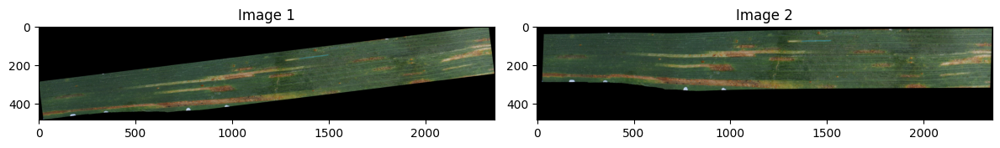

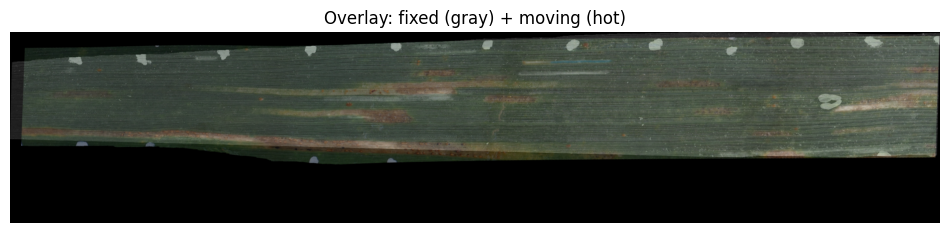

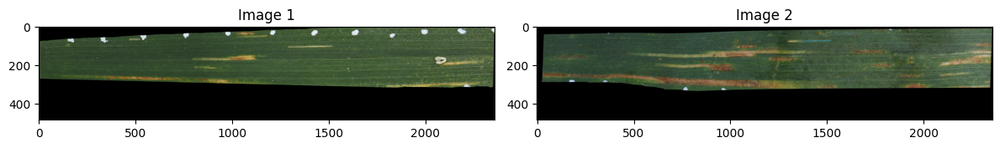

In [ ]:
from scipy.interpolate import RBFInterpolator
from scipy.ndimage import map_coordinates
# Nx2 arrays
# threshold = 0.5
threshold = 0.96
src_pts = mkpts1[confidence > threshold] # source landmark coordinates
dst_pts = mkpts0[confidence > threshold]  # matching destination landmarks

out = tps_scipy(dst_pts, src_pts, img_moving, smoothing=0)

_=plot_image_pair(img_moving, out)
_=plot_overlay(img_fixed, out)
_=plot_image_pair(img_fixed, out)